Importing the Dependencies

In [144]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import cufflinks as cf
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
cf.go_offline()
from sklearn import svm
from streamlit_option_menu import option_menu


In [145]:
# test_import.py
from sklearn import datasets
print("scikit-learn is installed correctly")


scikit-learn is installed correctly


Data Collection & Analysis

In [146]:
# loading the data from csv file to a Pandas DataFrame
parkinsons_data = pd.read_csv('parkinsons_data.csv')

In [147]:
# printing the first 5 rows of the dataframe
parkinsons_data.head()

,PatientId,age,Gender,fh,tremors,bk,mr,mh,N_motor_i,UPDRS_score,Jitter_percent,Smoking_status,shimmer_value,shimmer_type,NHR,HNR,RPDE,DFA,PPE
0,1,20,1,1,1,1,1,1,1,50.0,0.00662,1,0.02565,1,21.640,0.41888,0.54842,0.16006,0.4324
1,2,22,0,0,0,0,0,0,2,40.0,0.00300,0,0.02024,2,27.183,0.43493,0.56477,0.10810,0.4324
2,3,24,1,1,1,1,1,1,3,35.0,0.00481,1,0.01675,3,23.047,0.46222,0.54405,0.21014,0.4324
3,4,26,0,0,0,0,0,0,1,45.0,0.00528,0,0.02309,4,24.445,0.48730,0.57794,0.33277,0.4324
4,5,30,1,1,1,1,1,1,2,37.5,0.00335,1,0.01703,1,26.126,0.47188,0.56122,0.19361,0.4324


In [148]:
parkinsons_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   PatientId       5875 non-null   int64  
 1   age             5875 non-null   int64  
 2   Gender          5875 non-null   int64  
 3   fh              5875 non-null   int64  
 4   tremors         5875 non-null   int64  
 5   bk              5875 non-null   int64  
 6   mr              5875 non-null   int64  
 7   mh              5875 non-null   int64  
 8   N_motor_i       5875 non-null   int64  
 9   UPDRS_score     5875 non-null   float64
 10  Jitter_percent  5875 non-null   float64
 11  Smoking_status  5875 non-null   int64  
 12  shimmer_value   5875 non-null   float64
 13  shimmer_type    5875 non-null   int64  
 14  NHR             5875 non-null   float64
 15  HNR             5875 non-null   float64
 16  RPDE            5875 non-null   float64
 17  DFA             5875 non-null   f

In [149]:
parkinsons_data.drop(['PatientId'],axis = 1,inplace=True)

In [150]:
parkinsons_data['age']

0       20
1       22
2       24
3       26
4       30
        ..
5870    29
5871    30
5872    31
5873    32
5874    33
Name: age, Length: 5875, dtype: int64

In [151]:
parkinsons_data['age'].replace('Medium','High',inplace=True)

In [152]:
parkinsons_data['age'].replace('High','1',inplace=True)
parkinsons_data['age'].replace('Low','0',inplace=True)


In [153]:
parkinsons_data.head()

,age,Gender,fh,tremors,bk,mr,mh,N_motor_i,UPDRS_score,Jitter_percent,Smoking_status,shimmer_value,shimmer_type,NHR,HNR,RPDE,DFA,PPE
0,20,1,1,1,1,1,1,1,50.0,0.00662,1,0.02565,1,21.640,0.41888,0.54842,0.16006,0.4324
1,22,0,0,0,0,0,0,2,40.0,0.00300,0,0.02024,2,27.183,0.43493,0.56477,0.10810,0.4324
2,24,1,1,1,1,1,1,3,35.0,0.00481,1,0.01675,3,23.047,0.46222,0.54405,0.21014,0.4324
3,26,0,0,0,0,0,0,1,45.0,0.00528,0,0.02309,4,24.445,0.48730,0.57794,0.33277,0.4324
4,30,1,1,1,1,1,1,2,37.5,0.00335,1,0.01703,1,26.126,0.47188,0.56122,0.19361,0.4324


In [154]:
parkinsons_data['age'] = pd.to_numeric(parkinsons_data['Gender'])

In [155]:
# number of rows and columns in the dataframe
parkinsons_data.shape

(5875, 18)

In [156]:
parkinsons_data.isnull()

,age,Gender,fh,tremors,bk,mr,mh,N_motor_i,UPDRS_score,Jitter_percent,Smoking_status,shimmer_value,shimmer_type,NHR,HNR,RPDE,DFA,PPE
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5871,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5872,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5873,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [157]:
parkinsons_data.isnull().any()

age               False
Gender            False
fh                False
tremors           False
bk                False
mr                False
mh                False
N_motor_i         False
UPDRS_score       False
Jitter_percent    False
Smoking_status    False
shimmer_value     False
shimmer_type      False
NHR               False
HNR               False
RPDE              False
DFA               False
PPE               False
dtype: bool

In [158]:
parkinsons_data.isnull().sum()

age               0
Gender            0
fh                0
tremors           0
bk                0
mr                0
mh                0
N_motor_i         0
UPDRS_score       0
Jitter_percent    0
Smoking_status    0
shimmer_value     0
shimmer_type      0
NHR               0
HNR               0
RPDE              0
DFA               0
PPE               0
dtype: int64

<Axes: >

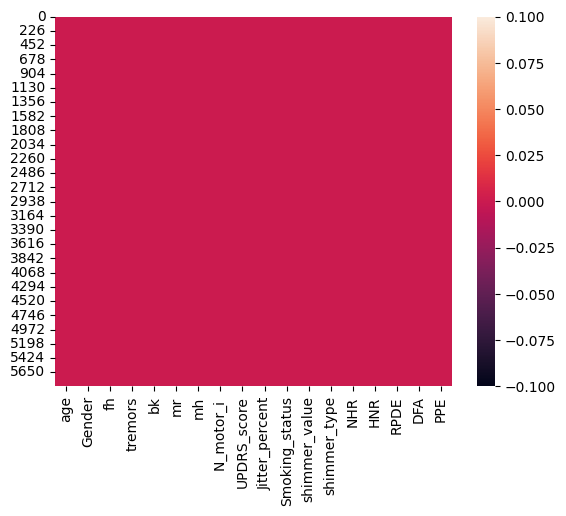

In [159]:
import seaborn as sns
sns.heatmap(parkinsons_data.isnull())

<Axes: xlabel='HNR', ylabel='count'>

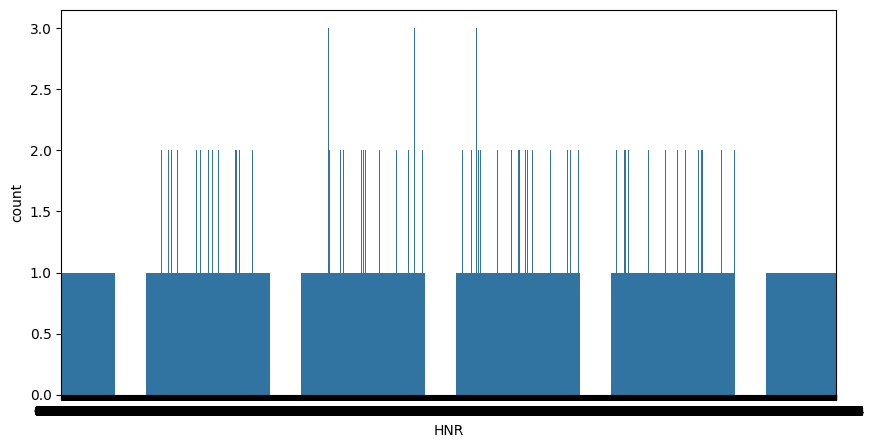

In [160]:
plt.figure(figsize=(10,5))
sns.countplot(x='HNR',data=parkinsons_data)

<Axes: xlabel='DFA', ylabel='count'>

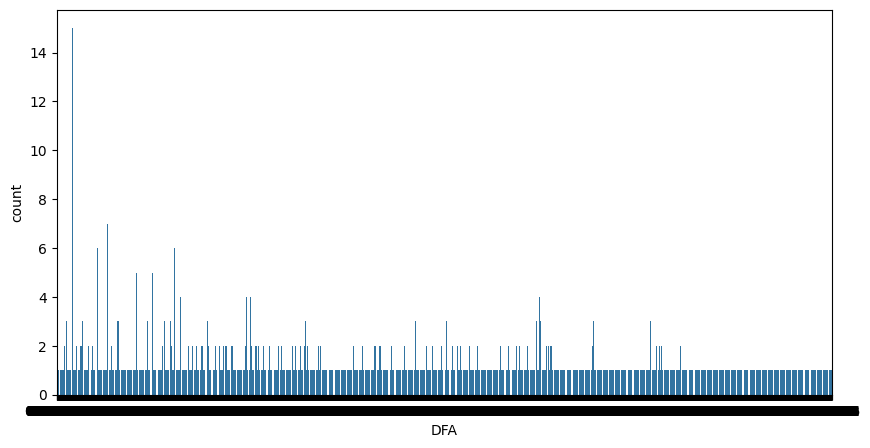

In [161]:
plt.figure(figsize=(10,5))
sns.countplot(x='DFA',data = parkinsons_data)

<Axes: xlabel='DFA', ylabel='age'>

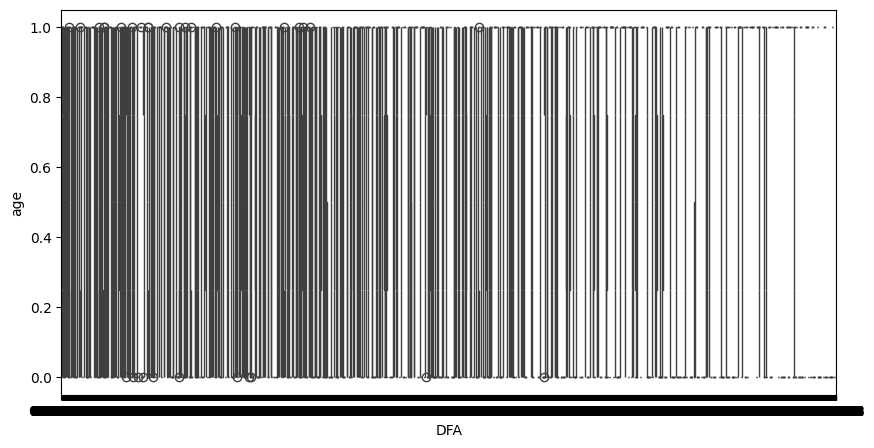

In [162]:
plt.figure(figsize=(10,5))
sns.boxplot(x='DFA',y='age',data = parkinsons_data)

<Axes: xlabel='HNR', ylabel='age'>

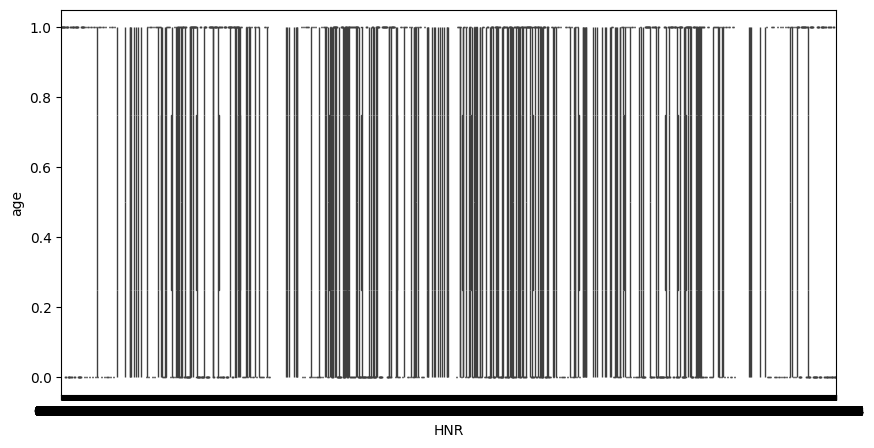

In [163]:
plt.figure(figsize=(10,5))
sns.boxplot(x='HNR',y='age',data = parkinsons_data)

In [164]:
sorted_smokers = parkinsons_data.groupby('age')['DFA'].count().to_frame()

In [165]:
sorted_smokers.style.background_gradient(cmap = 'Reds')

,DFA
age,
0,2789
1,3086


In [166]:
parkinsons_data.style.background_gradient(cmap = 'Reds')

In [167]:
label = parkinsons_data.age.sort_values().unique()       
target = sorted_smokers.DFA


In [168]:
print(label)
print(target)

[0 1]
age
0    2789
1    3086
Name: DFA, dtype: int64


In [169]:
print(sorted_smokers.columns)


Index(['DFA'], dtype='object')


In [170]:
import plotly.graph_objects as go

In [171]:
label = parkinsons_data.age.sort_values().unique()       
target = sorted_smokers.DFA


In [172]:
fig = go.Figure()
fig.add_trace(go.Bar(x=label,y=target))
fig.update_layout(title = 'Parkinsons Patient',xaxis=dict(title='Age'),yaxis=dict(title='DDA'))
fig.show()

## RandomForest Classifier

In [173]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=label,y=target,mode='markers+lines'))
fig.update_layout(title = 'Parkinsons Patients',xaxis=dict(title='Age'),yaxis=dict(title='DDA'))
fig.show()

In [174]:
import numpy as np

In [175]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import log_loss, f1_score
from sklearn.model_selection import cross_val_score
import numpy as np 
acc_dict = {}
# create the data
X = parkinsons_data.drop('age',axis = 1)
y = parkinsons_data['age']
X_train, X_test, y_train, y_test = train_test_split(X,y)

Accuracy score :  100.0


C:\Users\taffa\AppData\Local\Temp\ipykernel_1872\1466702522.py:19: RuntimeWarning:

divide by zero encountered in log



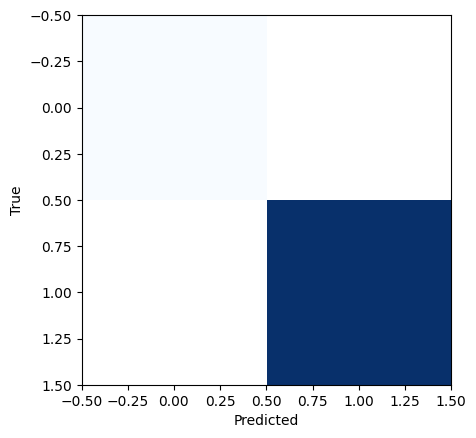

In [176]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, log_loss, f1_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

# create model
model = RandomForestClassifier()

# fit the data in the model
model.fit(X_train, y_train)

y_pred_randomF = model.predict(X_test)
print('Accuracy score : ', accuracy_score(y_test, y_pred_randomF) * 100)

acc_dict['RFC_log_loss'] = log_loss(y_test, y_pred_randomF)
acc_dict['RFC_F1_Score'] = f1_score(y_test, y_pred_randomF, average='weighted')

# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test, y_pred_randomF)), cmap='Blues', interpolation='nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()


Accuracy score :  100.0


C:\Users\taffa\AppData\Local\Temp\ipykernel_1872\1979220311.py:14: RuntimeWarning:

divide by zero encountered in log



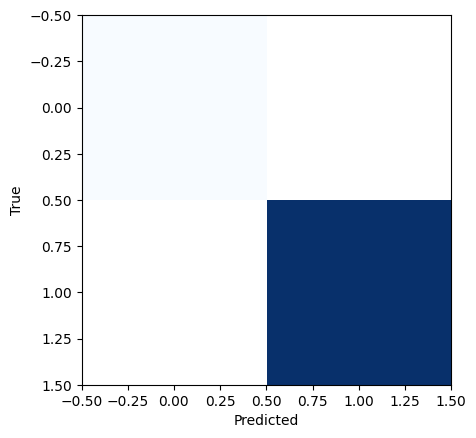

In [177]:
from sklearn.ensemble import  RandomForestClassifier
# create model
model = RandomForestClassifier()

# fit the data in the model
model.fit(X_train,y_train)

y_pred_randomF = model.predict(X_test)
print('Accuracy score : ',accuracy_score(y_test, y_pred_randomF)*100)

acc_dict['RFC_log_loss'] = log_loss(y_test, y_pred_randomF)
acc_dict['RFC_F!1_Score'] = f1_score(y_test, y_pred_randomF,average='weighted')
# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test,y_pred_randomF)),cmap = 'Blues',interpolation = 'nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

## KNeighbourClassifier

Best k is 3 with score 0.8715384753977263
Accuracy score on test set: 0.8849557522123894
Log Loss: 4.146614991668345
F1 Score: 0.88489953172089


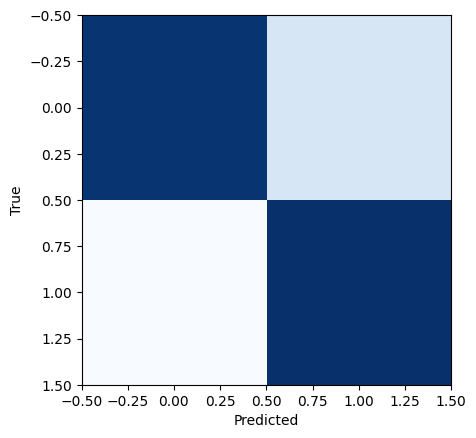

In [178]:
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, log_loss, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Instantiate SimpleImputer with mean strategy
imputer = SimpleImputer(strategy='mean')

# Impute missing values in X_train and X_test
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize variables to store the best k and its corresponding score
best_k = 0
high_score = 0

# Iterate over different values of k
for k in range(3, 12):
    # Create KNN classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # Perform cross-validation
    scores = cross_val_score(knn, X_train_imputed, y_train, cv=5)  # Assuming 5-fold cross-validation
    score = scores.mean()  # Compute mean score
    
    # Update best k and its corresponding score if current score is higher
    if score > high_score:
        high_score = score
        best_k = k

print('Best k is {} with score {}'.format(best_k, high_score))

# Fit KNN classifier with the best k on the entire training set
knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train_imputed, y_train)

# Make predictions on the test set
y_pred = knn.predict(X_test_imputed)

# Compute accuracy score
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy score on test set:', accuracy)

# Compute log loss
logloss = log_loss(y_test, y_pred)
print('Log Loss:', logloss)

# Compute F1 score
f1score = f1_score(y_test, y_pred, average='weighted')
print('F1 Score:', f1score)

# Plot confusion matrix
plt.imshow(np.log(confusion_matrix(y_test, y_pred)), cmap='Blues', interpolation='nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()


## KMeans Clustering

Accuracy score: 0.49761742682096666


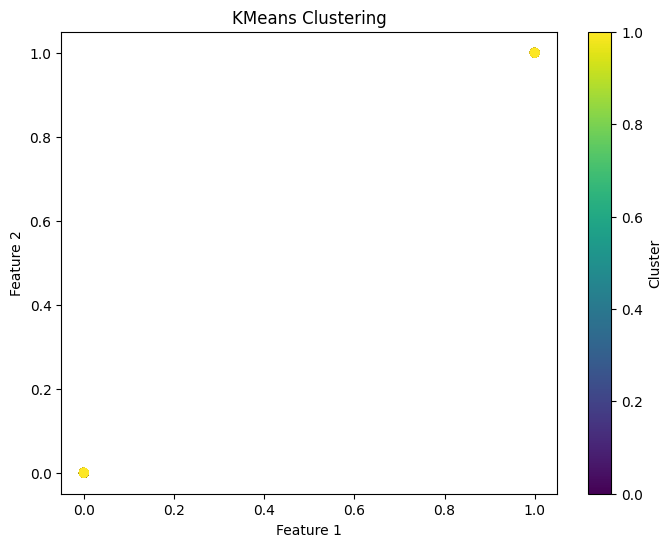

In [179]:
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
import numpy as np

# Assuming X_train, X_test, y_train, y_test are your training and test data
# Replace them with your actual data

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize KMeans model
kmeans = KMeans(n_clusters=2)  # Assuming 2 clusters, you can adjust this number

# Fit KMeans model on the imputed training data
kmeans.fit(X_train_imputed)

# Predict clusters for the test data
clusters = kmeans.predict(X_test_imputed)

# Calculate accuracy score (if true labels are available)
accuracy = accuracy_score(y_test, clusters)  # Replace y_test with your actual labels
print('Accuracy score:', accuracy)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(X_test_imputed[:, 0], X_test_imputed[:, 1], c=clusters, cmap='viridis')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('KMeans Clustering')
plt.colorbar(label='Cluster')
plt.show()


## Decision Tree Classifier

Accuracy score :  100.0


C:\Users\taffa\AppData\Local\Temp\ipykernel_1872\1182936360.py:10: RuntimeWarning:

divide by zero encountered in log



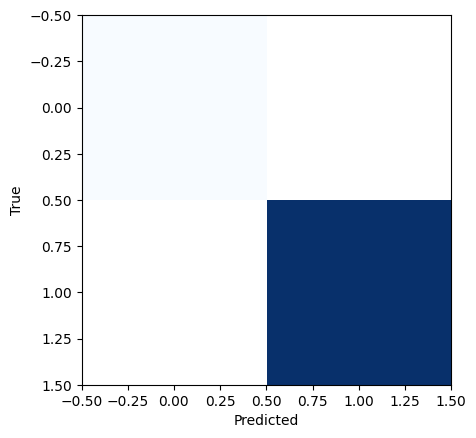

In [180]:
from sklearn.tree import DecisionTreeClassifier
tree_ = DecisionTreeClassifier()
tree_.fit(X_train,y_train)
y_pred = tree_.predict(X_test)
print('Accuracy score : ',accuracy_score(y_test, y_pred)*100)
acc_dict['Tree_log_loss'] = log_loss(y_test,y_pred)
acc_dict['Tree_f!1_score'] = f1_score(y_test,y_pred)

# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation = 'nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

## Support Vector Classifier

Accuracy score : 50.10211027910143


C:\Users\taffa\AppData\Local\Temp\ipykernel_1872\4228291085.py:18: RuntimeWarning:

divide by zero encountered in log



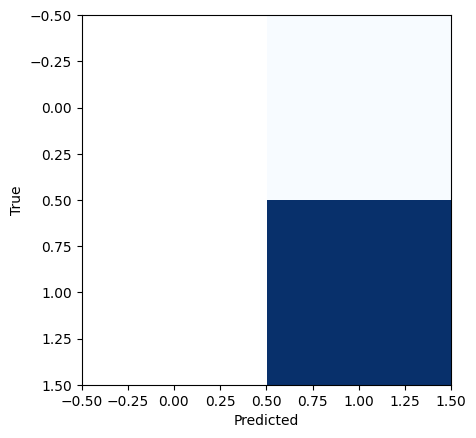

In [181]:
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

model = SVC()
model.fit(X_train_imputed, y_train)

X_test_imputed = imputer.transform(X_test)
y_pred = model.predict(X_test_imputed)

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy score :', accuracy * 100)

# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation = 'nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()


In [182]:
# getting more information about the dataset
parkinsons_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             5875 non-null   int64  
 1   Gender          5875 non-null   int64  
 2   fh              5875 non-null   int64  
 3   tremors         5875 non-null   int64  
 4   bk              5875 non-null   int64  
 5   mr              5875 non-null   int64  
 6   mh              5875 non-null   int64  
 7   N_motor_i       5875 non-null   int64  
 8   UPDRS_score     5875 non-null   float64
 9   Jitter_percent  5875 non-null   float64
 10  Smoking_status  5875 non-null   int64  
 11  shimmer_value   5875 non-null   float64
 12  shimmer_type    5875 non-null   int64  
 13  NHR             5875 non-null   float64
 14  HNR             5875 non-null   float64
 15  RPDE            5875 non-null   float64
 16  DFA             5875 non-null   float64
 17  PPE             5875 non-null   f

In [183]:
# checking for missing values in each column
parkinsons_data.isnull().sum()

age               0
Gender            0
fh                0
tremors           0
bk                0
mr                0
mh                0
N_motor_i         0
UPDRS_score       0
Jitter_percent    0
Smoking_status    0
shimmer_value     0
shimmer_type      0
NHR               0
HNR               0
RPDE              0
DFA               0
PPE               0
dtype: int64

In [184]:
# getting some statistical measures about the data
parkinsons_data.describe()

,age,Gender,fh,tremors,bk,mr,mh,N_motor_i,UPDRS_score,Jitter_percent,Smoking_status,shimmer_value,shimmer_type,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,0.525277,0.525277,0.525277,0.525277,0.525277,0.525277,0.525277,2.003745,75.710288,0.006154,0.525277,0.034035,2.499745,21.679495,0.541473,0.653240,0.219589,63.610858
std,0.499403,0.499403,0.499403,0.499403,0.499403,0.499403,0.499403,0.817322,101.520353,0.005624,0.499403,0.025835,1.118053,4.291096,0.100986,0.070902,0.091498,135.537043
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.206000,0.000830,0.000000,0.003060,1.000000,1.659000,0.151020,0.514040,0.021983,0.010000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,20.630000,0.003580,0.000000,0.019120,1.500000,19.406000,0.469785,0.596180,0.156340,0.592355
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,30.000000,0.004900,1.000000,0.027510,2.000000,21.920000,0.542250,0.643600,0.205500,0.654260
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,67.000000,0.006800,1.000000,0.039750,3.000000,24.444000,0.614045,0.711335,0.264490,0.909000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,431.000000,0.099990,1.000000,0.268630,4.000000,37.875000,0.966080,0.865600,0.731730,613.000000


In [185]:
# distribution of target Variable
parkinsons_data['age'].value_counts()

age
1    3086
0    2789
Name: count, dtype: int64

1  --> Parkinson's Positive

0 --> Healthy


In [186]:
# # grouping the data bas3ed on the target variable
parkinsons_data.groupby("age").mean()

,Gender,fh,tremors,bk,mr,mh,N_motor_i,UPDRS_score,Jitter_percent,Smoking_status,shimmer_value,shimmer_type,NHR,HNR,RPDE,DFA,PPE
age,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,2.013625,75.580788,0.006137,0.0,0.033917,2.500179,21.676268,0.541918,0.653325,0.219974,63.467652
1,1.0,1.0,1.0,1.0,1.0,1.0,1.994815,75.827325,0.006169,1.0,0.034142,2.499352,21.682412,0.541071,0.653163,0.219242,63.740281


Data Pre-Processing

Separating the features & Target

In [187]:
X = parkinsons_data.drop(columns=['age','DFA'], axis=1)
Y = parkinsons_data['PPE']

In [188]:
print(X)

      Gender  fh  tremors  bk  mr  mh  N_motor_i   UPDRS_score  \
0          1   1        1   1   1   1           1         50.0   
1          0   0        0   0   0   0           2         40.0   
2          1   1        1   1   1   1           3         35.0   
3          0   0        0   0   0   0           1         45.0   
4          1   1        1   1   1   1           2         37.5   
...      ...  ..      ...  ..  ..  ..         ...          ...   
5870       1   1        1   1   1   1           1         51.0   
5871       1   1        1   1   1   1           2         52.0   
5872       0   0        0   0   0   0           3         53.0   
5873       1   1        1   1   1   1           1         54.0   
5874       0   0        0   0   0   0           2         55.0   

      Jitter_percent  Smoking_status  shimmer_value  shimmer_type     NHR  \
0            0.00662               1        0.02565             1  21.640   
1            0.00300               0        0.02024  

In [189]:
print(Y)

0       0.43240
1       0.43240
2       0.43240
3       0.43240
4       0.43240
         ...   
5870    0.60824
5871    0.65917
5872    0.60781
5873    0.63342
5874    0.62029
Name: PPE, Length: 5875, dtype: float64


Splitting the data to training data & Test data

In [190]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [191]:
print(X.shape, X_train.shape, X_test.shape)

(5875, 16) (4700, 16) (1175, 16)


Model Training

Support Vector Machine Model

In [192]:
model = svm.SVC(kernel='linear')

In [193]:
from sklearn.linear_model import LinearRegression

# Check for NaN values in Y_train
nan_indices = np.isnan(Y_train)

# Remove samples with NaN labels
X_train_clean = X_train[~nan_indices]
Y_train_clean = Y_train[~nan_indices]

# Initialize the regression model
model = LinearRegression()

# Train the regression model with the cleaned data
model.fit(X_train_clean, Y_train_clean)


LinearRegression()

In [194]:
import numpy as np

# Check for NaN values in Y_train
nan_indices = np.isnan(Y_train)

# Remove samples with NaN labels
X_train_clean = X_train[~nan_indices]
Y_train_clean = Y_train[~nan_indices]

# Now, train your model with the cleaned or imputed data
model.fit(X_train_clean, Y_train_clean)


LinearRegression()

In [195]:
 # training the SVM model with training data
model.fit(X_train, Y_train)

LinearRegression()

In [196]:
from sklearn.metrics import mean_absolute_error

# Calculate mean absolute error on cleaned data
mae = mean_absolute_error(Y_train_clean, X_train_prediction_clean)


In [197]:
from sklearn.metrics import mean_squared_error

# Calculate mean squared error on cleaned data
mse = mean_squared_error(Y_train_clean, X_train_prediction_clean)


In [198]:
from sklearn.metrics import r2_score

# Calculate R-squared score on cleaned data
r2 = r2_score(Y_train_clean, X_train_prediction_clean)


In [199]:
import numpy as np
from sklearn.metrics import mean_absolute_error

# Assuming you have already trained your model and obtained predictions
# Replace `model` with the variable name of your trained model
X_train_prediction = model.predict(X_train)

# Check for NaN values in Y_train
nan_indices = np.isnan(Y_train)

# Remove samples with NaN labels
Y_train_clean = Y_train[~nan_indices]
X_train_prediction_clean = X_train_prediction[~nan_indices]

# Calculate Mean Absolute Error (MAE) on cleaned data
training_data_mae = mean_absolute_error(Y_train_clean, X_train_prediction_clean)


Model Evaluation

Accuracy Score

In [200]:
import numpy as np

# Define a threshold for considering predictions as correct
threshold = 0.1  # Adjust this threshold based on your problem domain

# Count the number of correct predictions within the threshold
num_correct_predictions = np.sum(np.abs(Y_train_clean - X_train_prediction_clean) < threshold)

# Calculate the "accuracy" score
total_samples = len(Y_train_clean)
training_data_accuracy = num_correct_predictions / total_samples


In [201]:
from sklearn.metrics import accuracy_score

# Define a threshold to binarize predictions and true values
threshold = 0.5  # Adjust this threshold based on your problem

# Binarize predictions and true values
binary_predictions = (X_train_prediction >= threshold).astype(int)
binary_true_values = (Y_train >= threshold).astype(int)

# Calculate accuracy score
training_data_accuracy = accuracy_score(binary_true_values, binary_predictions)


In [202]:
# # accuracy score on training data
# # X_train_prediction = model.predict(X_train)
# training_data_accuracy = accuracy_score(Y_train, X_train_prediction)

In [203]:
print('Accuracy score of training data : ', training_data_accuracy)

Accuracy score of training data :  1.0


In [204]:
from sklearn.metrics import accuracy_score

# Define a threshold to binarize predictions and true values
threshold = 0.5  # Adjust this threshold based on your problem

# Binarize predictions and true values
binary_predictions = (X_test_prediction >= threshold).astype(int)
binary_true_values = (Y_test >= threshold).astype(int)

# Calculate accuracy score
test_data_accuracy = accuracy_score(binary_true_values, binary_predictions)


In [205]:
# # accuracy score on training data
# X_test_prediction = model.predict(X_test)
# test_data_accuracy = accuracy_score(Y_test, X_test_prediction)

In [206]:
print('Accuracy score of test data : ', test_data_accuracy)

Accuracy score of test data :  1.0


Building a Predictive System

In [207]:
input_data = (1,20,1,1,1,1,1,1,50,0.00662,1,0.02565,1,21.64,0.41888,0.54842)

# changing input data to a numpy array
input_data_as_numpy_array = np.asarray(input_data)

# reshape the numpy array
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = model.predict(input_data_reshaped)
print(prediction)


if (prediction[0] == 0):
  print("The Person does not have Parkinsons Disease")

else:
  print("The Person has Parkinsons")


[0.54842]
The Person has Parkinsons


C:\Users\taffa\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



Saving the trained model

In [208]:
import pickle

In [209]:
filename = 'parkinsons_model.sav'
pickle.dump(model, open(filename, 'wb'))

In [210]:
# loading the saved model
loaded_model = pickle.load(open('parkinsons_model.sav', 'rb'))

In [211]:
for column in X.columns:
  print(column)

Gender
fh
tremors
bk
mr
mh
N_motor_i 
UPDRS_score
Jitter_percent
Smoking_status
shimmer_value
shimmer_type
NHR
HNR
RPDE
PPE


# Accuracy Report

|   Algorithm                  |   Accuracy score  |      
|------------------------------|-------------------|
|          RFC                 |      100.00       |       
|   Decision Tree Classifier   |      100.00       | 
|   Support Vector Classifier  |      70.00        |      
